<a href="https://colab.research.google.com/github/mkdir-sweetiepie/YOLOv8/blob/main/Object_Detection_YOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Object Detection** using YOLO11

In [2]:
# Check GPU
!nvidia-smi


Sun Feb 23 10:53:55 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   67C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
# Install the necessary libraries
!pip install ultralytics roboflow opencv-python pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.5/921.5 kB 20.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.1/83.1 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 16.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 78.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 67.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20

In [4]:
# Download the dataset
# !pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="afAV458dl3ol8zg3x73d") # Use your API key here
project = rf.workspace("project-cvkln").project("korean-melon-7q5cl")
version = project.version(2)
dataset = version.download("yolov8")

# Dataset link: https://universe.roboflow.com/roboflow-100/animals-ij5d2/dataset/2


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to korean-melon-2 in yolov8:: 100%|██████████| 348/348 [00:00<00:00, 4433.55it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
# *** Change path in data.yaml file for Google Colab ***
# path: /content/animals-2
# test: test/images    # relative to 'path'
# train: train/images  # relative to 'path'
# val: valid/images    # relative to 'path'


In [7]:
# Train the YOLO11 model
from ultralytics import YOLO
import os

# Path to the data.yaml file
data_yaml_path = os.path.join(dataset.location, 'data.yaml')

# Initialize the YOLO11 model - using the nano model for speed
model = YOLO('yolov8n.pt')  # Load a pretrained YOLOv8 model

# Train the model
model.train(task='detect', mode='train', data=data_yaml_path, epochs=10) # task and mode are optional parameters

# Train using CLI (In this project all python code is used instead of CLI)
# !yolo task=detect mode=train model=yolo11n.pt data=data_yaml_path epochs=10


100%|██████████| 6.25M/6.25M [00:00<00:00, 110MB/s]


Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/korean-melon-2/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, sho

100%|██████████| 755k/755k [00:00<00:00, 18.3MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 97.1MB/s]


AMP: checks passed ✅


train: Scanning /content/korean-melon-2/train/labels... 142 images, 0 backgrounds, 0 corrupt: 100%|██████████| 142/142 [00:00<00:00, 2281.77it/s]

train: New cache created: /content/korean-melon-2/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/korean-melon-2/valid/labels... 9 images, 0 backgrounds, 0 corrupt: 100%|██████████| 9/9 [00:00<00:00, 581.94it/s]

val: New cache created: /content/korean-melon-2/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.07G     0.9812      3.321      1.206         31        640: 100%|██████████| 9/9 [00:04<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]

                   all          9         33      0.016      0.667      0.272      0.159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.03G      0.835      2.185      1.026         57        640: 100%|██████████| 9/9 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

                   all          9         33     0.0225      0.909      0.486      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.04G     0.7847       1.69     0.9793         72        640: 100%|██████████| 9/9 [00:01<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.59it/s]

                   all          9         33          1      0.153      0.536      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.03G     0.7447       1.54     0.9772         68        640: 100%|██████████| 9/9 [00:01<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.88it/s]

                   all          9         33          1      0.304      0.769      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.01G     0.7298      1.326      0.946         47        640: 100%|██████████| 9/9 [00:02<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.18it/s]

                   all          9         33      0.853      0.353       0.67      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.03G     0.7047      1.225     0.9361         70        640: 100%|██████████| 9/9 [00:02<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

                   all          9         33          1      0.344      0.745      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.05G     0.6872      1.171     0.9349         61        640: 100%|██████████| 9/9 [00:01<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.44it/s]

                   all          9         33      0.909      0.545      0.804      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.03G     0.6929       1.12     0.9529         57        640: 100%|██████████| 9/9 [00:01<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]

                   all          9         33      0.847       0.67      0.817      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.03G     0.6516      1.034     0.9326         55        640: 100%|██████████| 9/9 [00:01<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.38it/s]


                   all          9         33      0.901      0.697      0.827      0.658

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.05G      0.675      1.008     0.9344         66        640: 100%|██████████| 9/9 [00:01<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

                   all          9         33      0.886       0.71      0.851      0.674



10 epochs completed in 0.011 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.38it/s]


                   all          9         33      0.887       0.71      0.851      0.674
      Ripe_KoreanMelon          9         33      0.887       0.71      0.851      0.674
Speed: 0.2ms preprocess, 3.6ms inference, 0.0ms loss, 5.1ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b70120ff3d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [8]:
# Validate the model
metrics = model.val()

# Print the evaluation metrics
print("Model Evaluation Metrics:", metrics)


Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/korean-melon-2/valid/labels.cache... 9 images, 0 backgrounds, 0 corrupt: 100%|██████████| 9/9 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


                   all          9         33      0.886       0.71      0.851       0.68
      Ripe_KoreanMelon          9         33      0.886       0.71      0.851       0.68
Speed: 0.2ms preprocess, 25.8ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/detect/train2
Model Evaluation Metrics: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b7014586410>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.0240

In [ ]:
# Export the model
# model.export(format='onnx')  # You can choose 'tflite', 'torchscript', etc.


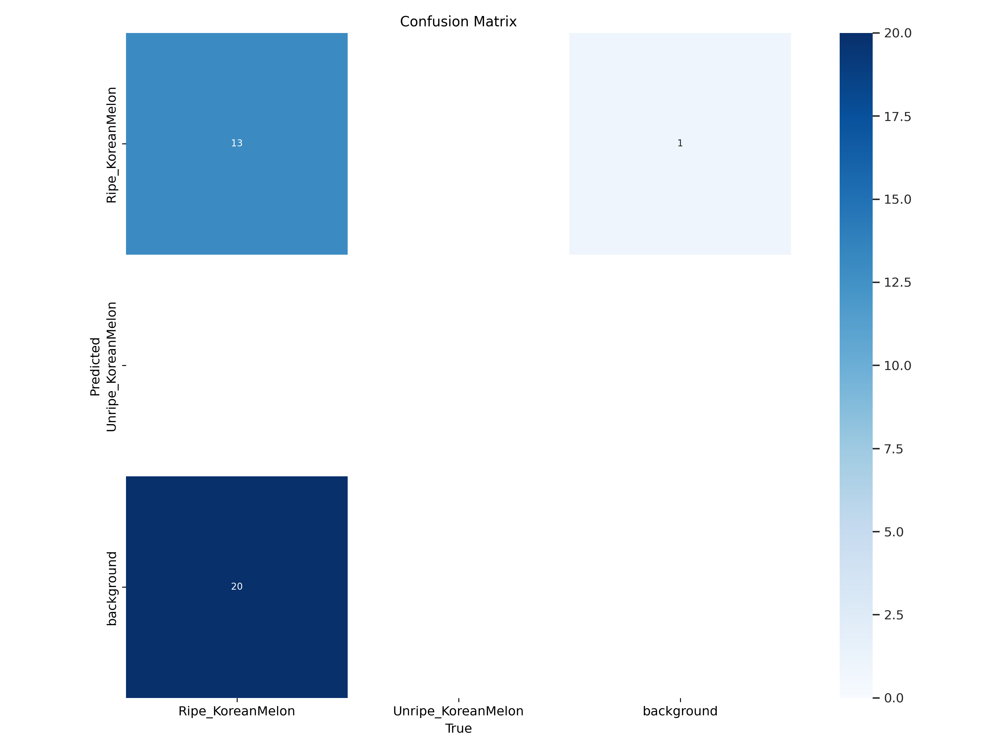

In [9]:
# Show Confusion Matrix
from IPython.display import Image, display
display(Image('/content/runs/detect/train/confusion_matrix.png'))


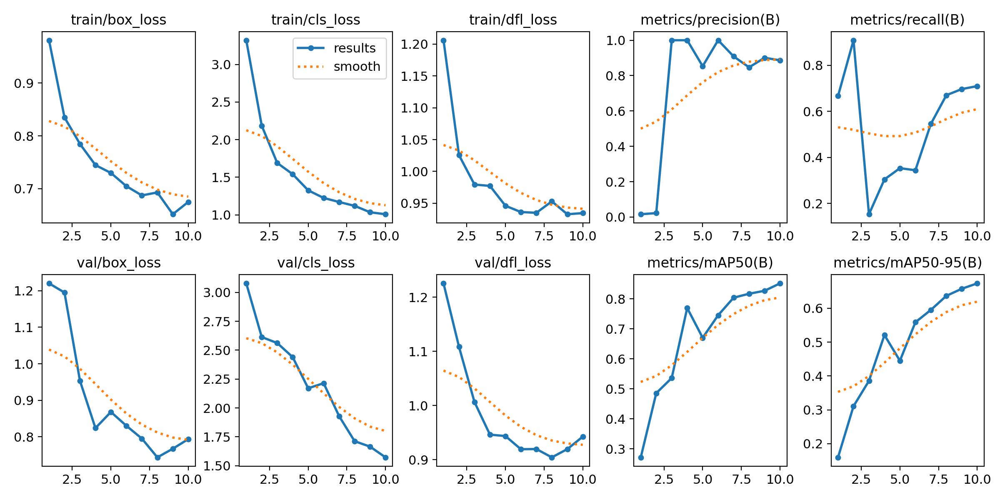

In [10]:
# Show Results (image)
display(Image('/content/runs/detect/train/results.png'))


In [11]:
# Show results (table)
import pandas as pd

# Load the CSV file into a pandas DataFrame
csv_file_path = '/content/runs/detect/train/results.csv'
df = pd.read_csv(csv_file_path)

# Display the DataFrame
print(df)


   epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1  10.2727         0.98116         3.32107         1.20619   
1      2  14.2071         0.83502         2.18458         1.02554   
2      3  17.2576         0.78469         1.69002         0.97933   
3      4  20.0912         0.74467         1.54021         0.97716   
4      5  22.8576         0.72979         1.32616         0.94599   
5      6  26.0291         0.70470         1.22459         0.93610   
6      7  29.1374         0.68722         1.17073         0.93490   
7      8  31.8757         0.69293         1.11978         0.95288   
8      9  34.6408         0.65159         1.03427         0.93264   
9     10  37.3970         0.67495         1.00806         0.93442   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.01597            0.66667           0.27176   
1               0.02246            0.90909           0.48560   
2               1.00000            0.15297      

In [12]:
# Package imports and train path
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

train_path = '/content/runs/detect/train'


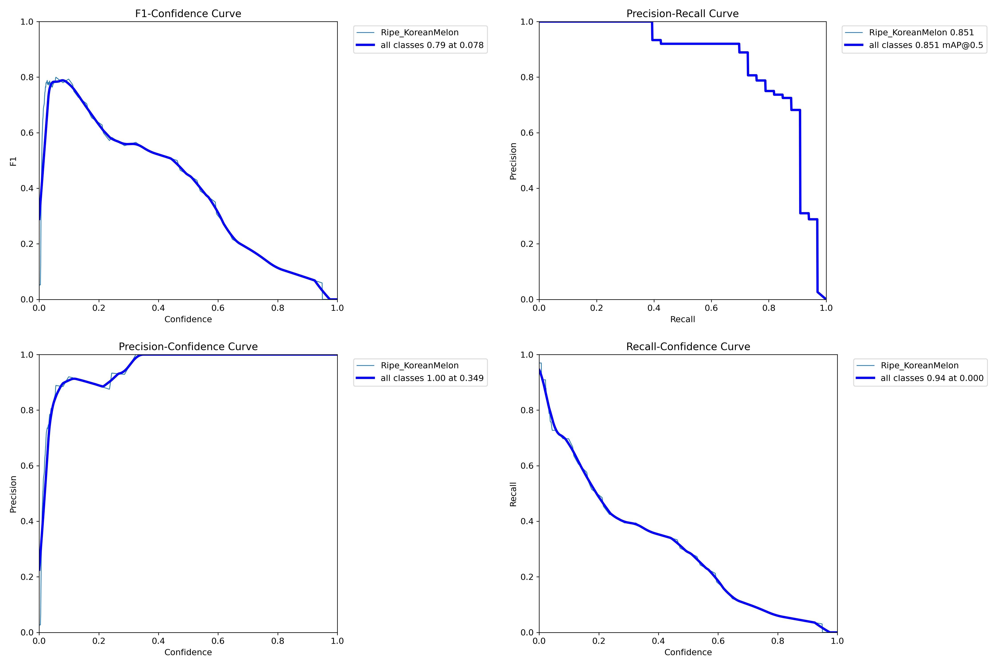

In [13]:
# Show curves of F1-Confident, Precision-Recall, Precision-Confident and Recall-Confident

# Load your images using OpenCV
img1 = cv2.imread(f'{train_path}/F1_curve.png')
img2 = cv2.imread(f'{train_path}/PR_curve.png')
img3 = cv2.imread(f'{train_path}/P_curve.png')
img4 = cv2.imread(f'{train_path}/R_curve.png')

# Concatenate images horizontally
top_row = cv2.hconcat([img1, img2])
bottom_row = cv2.hconcat([img3, img4])

# Concatenate the two rows vertically
grid = cv2.vconcat([top_row, bottom_row])

# Display the concatenated image
cv2_imshow(grid)


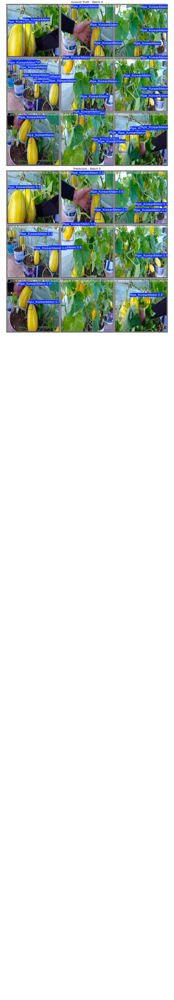

In [18]:
# Validation Results: Ground Truth vs Prediction

# Load your images using matplotlib's imread
img1 = mpimg.imread(f'{train_path}/val_batch0_labels.jpg')
img2 = mpimg.imread(f'{train_path}/val_batch0_pred.jpg')
# img3 = mpimg.imread(f'{train_path}/val_batch1_labels.jpg')
# img4 = mpimg.imread(f'{train_path}/val_batch1_pred.jpg')
# img5 = mpimg.imread(f'{train_path}/val_batch2_labels.jpg')
# img6 = mpimg.imread(f'{train_path}/val_batch2_pred.jpg')

# Get image dimensions (assuming all images are of the same size)
img_height, img_width, _ = img1.shape

# Create a figure with subplots, adjusting the figure size to match the image size
fig, axes = plt.subplots(6, 1, figsize=(img_width / 100, 6 * img_height / 100))  # 6 rows, 1 column

# Add a title to the figure with a bigger font size
# fig.suptitle('Validation Results: Ground Truth vs Prediction', fontsize=24)

# Plot the images and add larger titles for each subplot
axes[0].imshow(img1)
axes[0].set_title("Ground Truth - Batch 0", fontsize=22)  # Larger subplot title
axes[1].imshow(img2)
axes[1].set_title("Prediction - Batch 0", fontsize=22)

# axes[2].imshow(img3)
# axes[2].set_title("Ground Truth - Batch 1", fontsize=22)
# axes[3].imshow(img4)
# axes[3].set_title("Prediction - Batch 1", fontsize=22)

# axes[4].imshow(img5)
# axes[4].set_title("Ground Truth - Batch 2", fontsize=22)
# axes[5].imshow(img6)
# axes[5].set_title("Prediction - Batch 2", fontsize=22)

# Turn off axes for all subplots
for ax in axes:
    ax.axis('off')

# Adjust layout to prevent overlap and show the title
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Display the plot
plt.show()


In [26]:
# Predict on test data using trained model

# Load trained model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Specify the test folder path
test_path = '/content/korean-melon-2/test/images/'

# List all images in the test folder
image_files = [os.path.join(test_path, img) for img in os.listdir(test_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Predict each images
for img_path in image_files:
    results = model.predict(source=img_path, save=True, conf=0.50)



image 1/1 /content/korean-melon-2/test/images/95_jpg.rf.1185369fb2736ab37f024036cffd5b94.jpg: 640x640 1 Ripe_KoreanMelon, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict4

image 1/1 /content/korean-melon-2/test/images/111_jpg.rf.82a464ca34a0458f9be28dd3d4dc0cc9.jpg: 640x640 1 Ripe_KoreanMelon, 8.2ms
Speed: 2.6ms preprocess, 8.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict4

image 1/1 /content/korean-melon-2/test/images/77_jpg.rf.9c569ab0453ba8a6719808b874ab3407.jpg: 640x640 (no detections), 7.3ms
Speed: 1.7ms preprocess, 7.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict4

image 1/1 /content/korean-melon-2/test/images/27_jpg.rf.f9ae1bef3bc0cf617b01064692f840da.jpg: 640x640 1 Ripe_KoreanMelon, 7.3ms
Speed: 1.7ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3

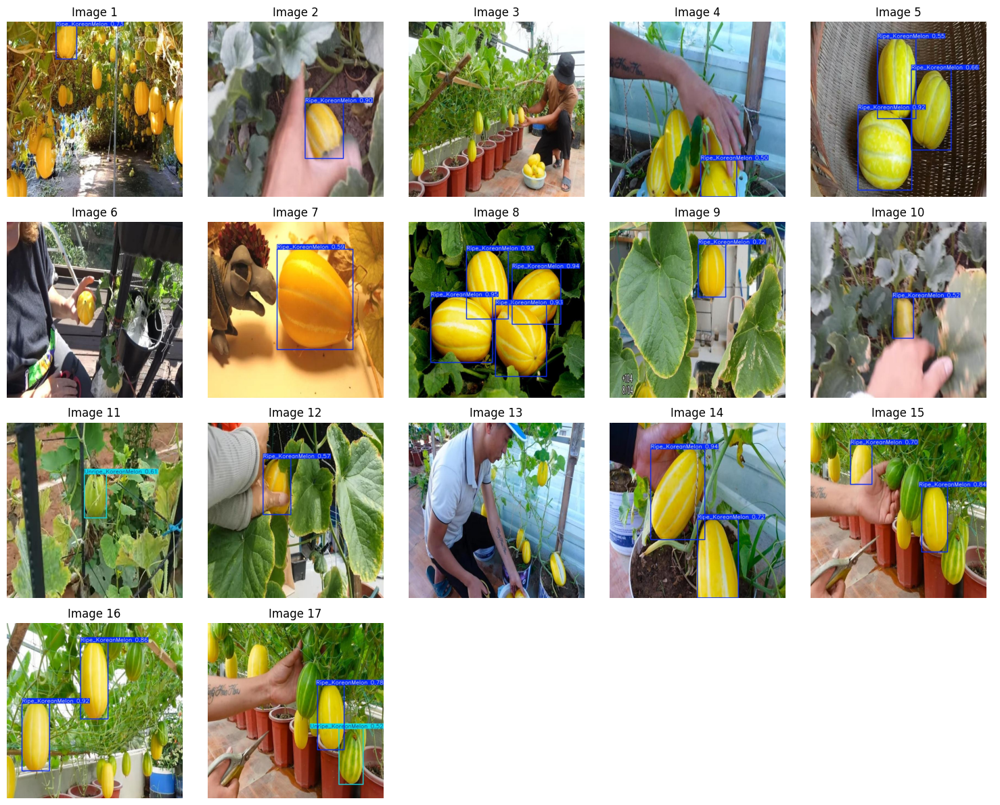

In [27]:
# Plot prediction on test images

# Specify the predict folder path
pred_path = '/content/runs/detect/predict'

# List all images in the predict folder
pred_image_files = [os.path.join(pred_path, img) for img in os.listdir(pred_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Number of images per row
images_per_row = 5

# Calculate the number of rows needed
n_rows = len(pred_image_files) // images_per_row + int(len(pred_image_files) % images_per_row != 0)

# Set figure size
fig, axs = plt.subplots(n_rows, images_per_row, figsize=(15, 3 * n_rows))

# Flatten axes if necessary (for easier iteration)
axs = axs.flatten()

# Loop through each image and display it
for i, img_path in enumerate(pred_image_files):
    img = mpimg.imread(img_path)      # Read the image
    axs[i].imshow(img)                # Show the image
    axs[i].axis('off')                # Turn off axis
    axs[i].set_title(f"Image {i+1}")  # Add title

# Hide any extra empty subplots (if the number of images is not a perfect multiple of images_per_row)
for j in range(i+1, len(axs)):
    axs[j].axis('off')  # Hide unused axes

# Display all images
plt.tight_layout()
plt.show()


# This project is only for learning purpose
The accuracy of the model is very low because it has been trained over very few epochs.